# CS405_Lab6_CNN Architectures_and_Transfer_Learning


# TASKS FOR THE LAB:

There are two parts for this elaborative lab that you will have to carry out, but first and foremost the important instruction for the lab is to **listen to your instructor. It will help you understand and perform the lab easily.**

1. You will be preparing a report for answering the specific questions asked throughout this notebook. Please be attentive to avoid missing any such questions.
2. As the title suggests this lab is designed for you to learn to implement CNN architectures by yourselves and also use the pretrained architectures available to you thanks to the scientific community. The tasks for this part will appear to you as you scroll down the notebook.

Other than that, we are also going to learn the following very useful aspects of a deep learning project that are used very frequently:

* Tensorboard
  * Log data
  * Visualize the model
*   Checkpointing: Saving the optimizer, scheduler and other metrics along with the model for resuming training in the future

Note: Once you have completed the lab, consider retaining this notebook as your primary resource for any potential future utilization of the provided code, like for checkpointing or integrating with TensorBoard for various purposes

# Package installations and imports  

In [2]:
import torch
import torchvision
import os
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import torch.nn as nn
import numpy as np
from tqdm import tqdm
from torchsummary import summary

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
!pip install --upgrade --no-cache-dir gdown

  Attempting uninstall: gdown
    Found existing installation: gdown 4.7.3
    Uninstalling gdown-4.7.3:
      Successfully uninstalled gdown-4.7.3


# Data Preparation

## Vegetable Dataset

For this lab, we will be using only the test set of the Vegetable Dataset as our working dataset consisting of only 3000 Images because today's lab is about using pretrained networks and how can we achieve good performance with them when we have less amounts of data. We will divide this data into train, validation and test sets (with a split of 70%, 15% and 15%, respectively. Another purpose of doing this is to perform quick train, validation and testing experiments with a small dataset.

Train: 2100

Val: 450

Test: 450

https://www.kaggle.com/datasets/misrakahmed/vegetable-image-dataset

## Download and unzip the dataset

In [14]:
# download test_set
!gdown https://drive.google.com/file/d/1aXaH7F6iNlK2mqzZBY_mMF5uazwQHM7W/view?usp=sharing --fuzzy

Failed to retrieve file url:

	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses.

You may still be able to access the file from the browser:

	https://drive.google.com/uc?id=1aXaH7F6iNlK2mqzZBY_mMF5uazwQHM7W

but Gdown can't. Please check connections and permissions.


In [15]:
%%capture
!unzip /content/vegetable_test.zip;

## Loading the train, val and test sets from their respective folders

### Initializing ImageFolder (dataset) Instances

In [6]:
image_size = 224
batch_size = 64

In [12]:
!ls

sample_data


In this lab, we will learn about using pre-trained models.

In order to quickly execute training loops and prove that using pretrained models help us achieve good results with less amounts of data we will use split the test set of the vegetable dataset as the train_set, val_set and test_set.

## Question 1: What does the torchvision.transforms.Compose() function do in the cell below?

In [7]:
transform = torchvision.transforms.Compose([torchvision.transforms.ToTensor(), torchvision.transforms.Resize((image_size,image_size))])

 ***torchvision.transforms.Compose() allows us to define multiple sequential transformations. It returns an object that can be used with the dataset class***

## Question 2: What is the torchvision.datasets.ImageFolder() method used for in the cell below? What are its arguments?

***Image folder allows easy loading of image data into the memory easily. It automatically adds labels to the the images based upon the folder name.***

In [16]:
# path to our datset
data_path = '/content/vegetable_test'

#Initialize the dataset instance from the given datapath
data_set = torchvision.datasets.ImageFolder(root=data_path, transform=transform)

In [86]:
len(data_set)

3000

In [17]:
#Side note: you can access transform of a dataset object like this:
data_set.transform

Compose(
    ToTensor()
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=warn)
)

In [18]:
# Split the dataset into train, validation and test splits
train_set, val_set, test_set = torch.utils.data.random_split(data_set, [2100, 450, 450], generator=torch.Generator().manual_seed(42))

In [19]:
#Side note: For subset of the data_set like train_set, you can access its transform like this:
train_set.dataset.transform

Compose(
    ToTensor()
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=warn)
)

In [20]:
# Class to number of instances
# caution: takes some time to complete for large datasets
total = 0
class_counts = np.zeros(len(train_set.dataset.classes))
for image, label in train_set:
    class_counts[label] += 1
    total +=1
for i in range(len(class_counts)):
  print("class:%s, instances: %d"%([k for k,v in train_set.dataset.class_to_idx.items() if v == i], class_counts[i]))

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


class:['Bean'], instances: 145
class:['Bitter_Gourd'], instances: 141
class:['Bottle_Gourd'], instances: 138
class:['Brinjal'], instances: 144
class:['Broccoli'], instances: 126
class:['Cabbage'], instances: 134
class:['Capsicum'], instances: 141
class:['Carrot'], instances: 155
class:['Cauliflower'], instances: 133
class:['Cucumber'], instances: 144
class:['Papaya'], instances: 142
class:['Potato'], instances: 143
class:['Pumpkin'], instances: 128
class:['Radish'], instances: 144
class:['Tomato'], instances: 142


## Question 3: What is the if-elif condition used for in the cell below?

***it is used to handle two situations, in this code we have used data.random_split() to divide our data into train, val and test so the object structure has been changed an new wrapper has been added above the dataset class so in order to access the classes we first need to access the dataset and then classes. ***

In [21]:
# Print the classes in the dataset
classes = None
if hasattr(train_set, 'classes'):
      classes = train_set.classes
elif hasattr(train_set, 'dataset') and hasattr(train_set.dataset, 'classes'):
      classes = train_set.dataset.classes

len(classes)

15

## Function for visualizing images of dataset object

In [22]:
def show_dataset_samples(data_set):
    loader = torch.utils.data.DataLoader(
    data_set,
    batch_size=32,
    shuffle=True)

  # Get a batch of images from the train_loader
    images, labels = next(iter(loader))

    rows = col = 3
    #fig, axes = plt.subplots(nrows=5, ncols=5)                          )
    plt.figure(figsize = (10,10))

    for i in range(rows*col):
      # Plot a random image from the batch
      random_index = np.random.randint(0, images.shape[0])
      image = images[random_index]
      label = labels[random_index]
      plt.subplot(rows, col, i+1)
      plt.axis('off')
      plt.imshow(image.permute(1,2,0))

      if hasattr(train_set, 'classes'):
        classes = train_set.classes
      elif hasattr(train_set, 'dataset') and hasattr(train_set.dataset, 'classes'):
        classes = train_set.dataset.classes

      plt.title(f'Label: {classes[label]}')

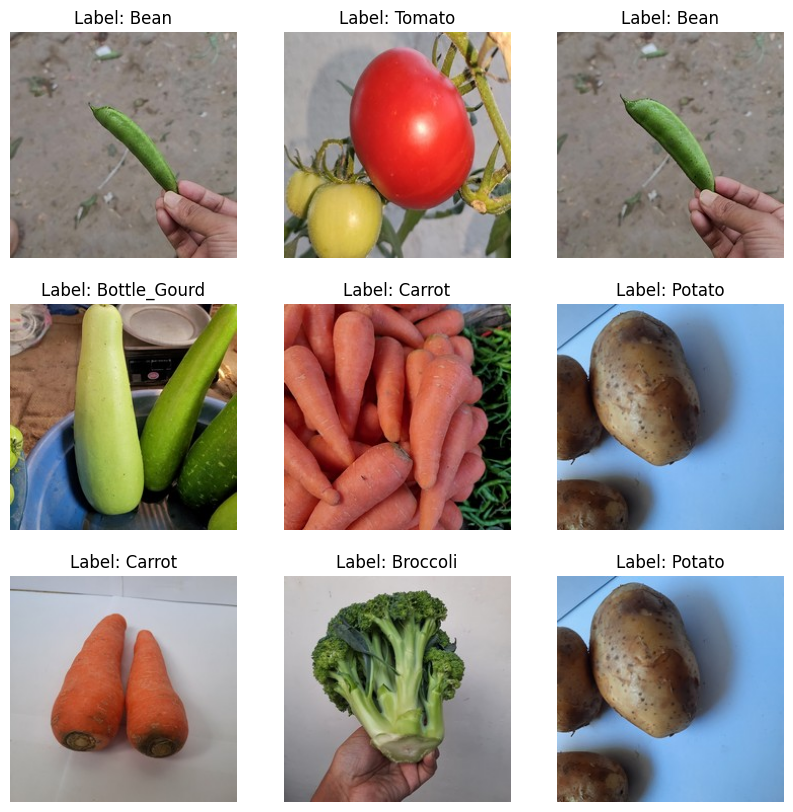

In [23]:
show_dataset_samples(train_set)

## Compute standardization parameters and apply

In [24]:
def get_mean_and_std(dataloader):
    channels_sum, channels_squared_sum, num_batches = 0, 0, 0
    for data, _ in dataloader:
        # Mean over batch, height and width, but not over the channels
        channels_sum += torch.mean(data, dim=[0,2,3])
        channels_squared_sum += torch.mean(data**2, dim=[0,2,3])
        num_batches += 1

    mean = channels_sum / num_batches

    # std = sqrt(E[X^2] - (E[X])^2)
    std = (channels_squared_sum / num_batches - mean ** 2) ** 0.5

    return mean, std

# https://towardsdatascience.com/how-to-calculate-the-mean-and-standard-deviation-normalizing-datasets-in-pytorch-704bd7d05f4c

## Question 4: Why are we calculating the mean and std of only the trian_set in the cell below? Why not calculate for the whole dataset?

***we are calculating meand and std to use them in transformations. and we use transformation of different types so that our distribution is such that it has variety and is easy learn. such transformations are not needed in the testing and validation because we are not learning anything in later stages***


In [25]:
# Create a dummy dataloader for our train_set
dataloader = torch.utils.data.DataLoader(dataset=train_set, batch_size=32)
# Call the function and compute mean and std
mean, std = get_mean_and_std(dataloader)
print(mean, std)

tensor([0.4681, 0.4648, 0.3449]) tensor([0.2338, 0.2292, 0.2433])


In [26]:
# Add the new normalization to the existing transforms
normalize = torchvision.transforms.Normalize(mean=mean, std=std)
transform = torchvision.transforms.Compose([transform, normalize])

## Question 5: How are we updating the transforms of our subsets in the cell below?

***we are creating a new transform object by using same transform.compose function to combine the new and old transforms, and then we are finally updating the transform on the dataset***

In [27]:
# A function for updating the transforms of our dataset objects
def update_transform(dataset, transform):
    if hasattr(dataset, 'transform'):
      dataset.transform = transform
    elif hasattr(dataset, 'dataset') and hasattr(dataset.dataset, 'transform'):
      dataset.dataset.transform = transform
    else:
      print("No transform attribute found.")

In [28]:
# Add the normalization transform to the datasets
# using the "update_transform" function
update_transform(train_set, transform)
update_transform(val_set, transform)
update_transform(test_set, transform)

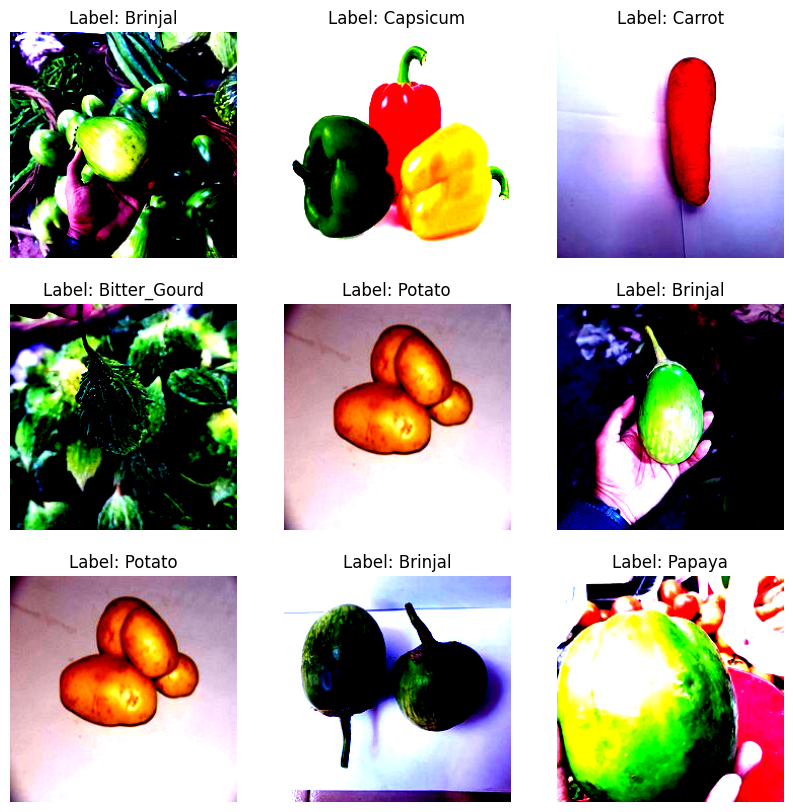

In [29]:
### Visualize the images with the new normalization transform
show_dataset_samples(train_set)

## Data Augmentation

## Question 6: What transforms are we using in the cell below?
## Question 7: Why are we only applying them to the train_set?

*   **Rondom Flips, flips images randomly with some probability default 0.5**
*   **Random Rotation, rotates the image randomly for max of 45 degrees**
*   **Gussain Blur, adds blur on the images using the guassian function**
**We are applying these transforms only on the training set because as explained earlier we do these transformations to make learning efficient**

In [30]:
# composing transforms instance for data augmentation
augmentation_transforms = torchvision.transforms.Compose([transform,
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomVerticalFlip(),
    torchvision.transforms.RandomRotation(degrees=45),
    torchvision.transforms.GaussianBlur(5)
    ])

# Add the augmentation_transfomers to the train_set
update_transform(train_set, transform)

## Initializing the pytorch dataloaders and visualize train examples

In [31]:
train_loader = torch.utils.data.DataLoader(
    train_set,
    batch_size=batch_size,
    shuffle=True
)

val_loader = torch.utils.data.DataLoader(
    val_set,
    batch_size=batch_size,
    shuffle=False
)

test_loader = torch.utils.data.DataLoader(
    test_set,
    batch_size=batch_size,
    shuffle=False
)


# Convolutional Neural Networks Architectures

# TASKS
# You have two tasks to perform in this lab:

## Task 1:
In the cells below the VGG16 model has been manually implemented for you to initialize a VGG16 model with random variables. You have also been provided code for using a pretrained VGG16 model.

1. You to first train the manually implemented model for 15 epochs, save its training and validation plots and evaluate it on the test set.
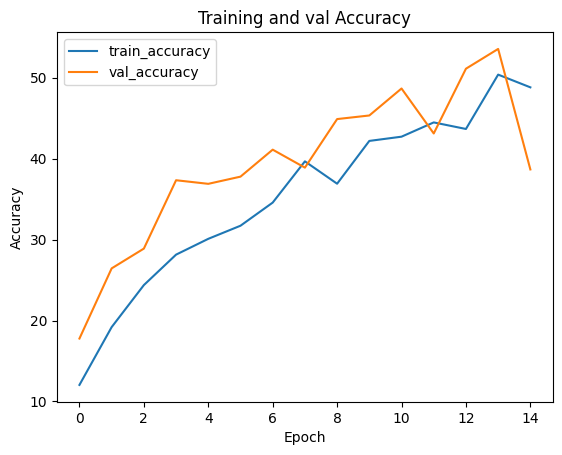

2. Then, using the provided code, fine-tune the pre-trained model for a 3 epochs, save its training and validation plots and evaluate it on the test set.  

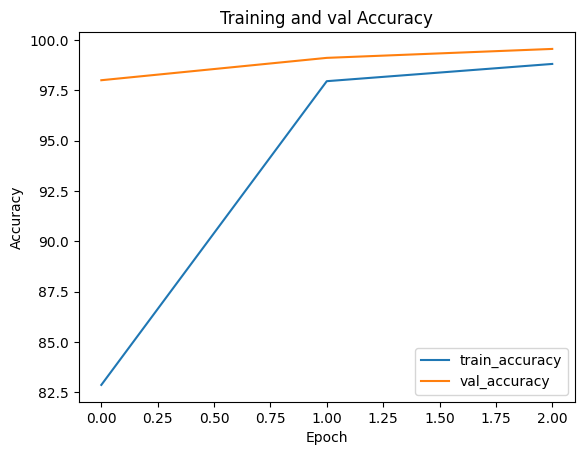




Compare the performance and traning plots of the pre-trained model with those of the model trained from scratch. Report and discuss your observations in the Lab Report for both models.

## Task 2:
Train a pretrained ResNet-50 model on the same dataset for a few epochs 2-3 epochs, save its plots, evaluate it on the test set and compare its performance with that of the pre-trained VGG-16 model. Report and discuss your observations.

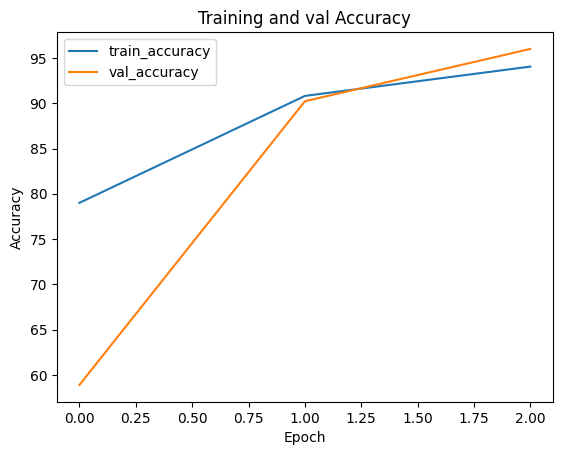


## Question 8: Instead of fine-tuning the pre-trained model for a few epochs what would happen if we train the pre-trained model for a large number of epochs on the train_set?

***If we train the pretrained model once more on our dataset then the performance should imporve, that can be done in the cases where our pretrained model was trained on a very different distribution of data. In those cases it would be more reasonable. However in other cases where the two distributions are comparable we can obtain satisfactory results from mere fine tuning***


## VGG-16 Manual Implementation and Random Initialization
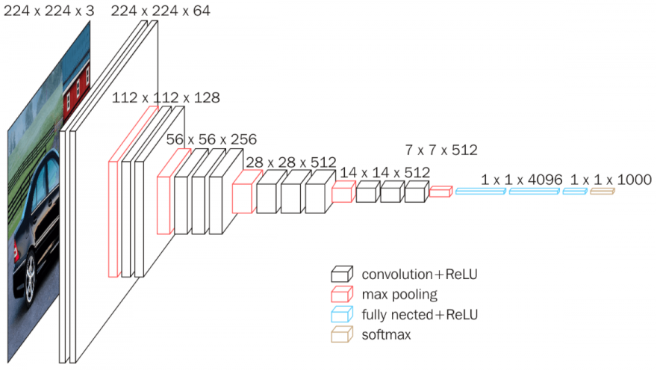

In [ ]:
class VGG16(nn.Module):
    def __init__(self, num_classes=15, im_height=224, im_width=224):

        super(VGG16, self).__init__()

        max_pool_count = 5
        size_reduction_factor = 2**max_pool_count
        out_height = im_height // size_reduction_factor
        out_width = im_width // size_reduction_factor

        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU())

        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.layer3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU())

        self.layer4 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.layer5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU())

        self.layer6 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU())

        self.layer7 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.layer8 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU())

        self.layer9 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU())

        self.layer10 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.layer11 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU())

        self.layer12 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU())

        self.layer13 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(out_height*out_width*512, 4096),
            nn.ReLU())

        self.fc1 = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU())

        self.fc2= nn.Sequential(
            nn.Linear(4096, num_classes))

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.layer5(out)
        out = self.layer6(out)
        out = self.layer7(out)
        out = self.layer8(out)
        out = self.layer9(out)
        out = self.layer10(out)
        out = self.layer11(out)
        out = self.layer12(out)
        out = self.layer13(out)
        out = out.reshape(out.size(0), -1)
        out = self.fc(out)
        out = self.fc1(out)
        out = self.fc2(out)
        return out

# Source: https://blog.paperspace.com/vgg-from-scratch-pytorch/

In [ ]:
model = VGG16()

# Torchvision Pretrained VGG16 Model

In [52]:
# https://pytorch.org/vision/stable/models.html
model = torchvision.models.vgg16(pretrained= True)

# Alternate method of initialization:
# modelVGG = torchvision.models.vgg19(weights=torchvision.models.VGG19_Weights)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 173MB/s]


The "parameters()" attribute of a model returns us a generator that iteratively provides us the parameters of each layer of the model.

In the code below, we use a for loop to iterate over the parameters of each layer in the model.

The requires_grad flag for parameters of a layer signifies whether to calculate the gradients for those parameters when doing a backward pass. So initially we set requires_grad to false for parameters of all the layers

In [53]:
for param in model.parameters():
    param.requires_grad = False

### Replace an exisiting layer in model (VGG16)

The VGG16 model is divided into two sequential parts: First one is the "features" module and the second one is the classifer module. The "features" module consists of all the 2D opertation layers and the "classifier" module consists of all the fully connected layers.

In our case, the vegetable dataset has 15 classes, so we initialize a new layer and replace the last linear layer of the classifier that has 1000 outputs for 1000 classes of imagenet with the new layer with 15 outputs.


In [54]:
model.classifier[-1] = nn.Linear(in_features=4096, out_features= 15)

AttributeError: 'ResNet' object has no attribute 'classifier'

# Loading Resnet-50


In [58]:
model = torchvision.models.resnet50(pretrained= True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [60]:
# printing the model's architecture for updation
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [62]:
#changing the last fc layer to match the problem and predict features of size 15
model.fc = nn.Linear(in_features=2048, out_features= 15)

## Loss Function and Optimizer Selection

In [63]:
# Select a loss function
loss_function = torch.nn.CrossEntropyLoss()

# Select an optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Define the learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)
# For more on schedulers please visit:
# https://towardsdatascience.com/a-visual-guide-to-learning-rate-schedulers-in-pytorch-24bbb262c863

# Set the number of epochs
# This variable is used in the main training loop
epochs =3

model.to(device);


# Training

## Function for running the model over all the samples of a given dataloader object

In [64]:
def run_1_epoch(model, loss_fn, loader, optimizer = None, train = False):

  if train:
    model.train()
  else:
    model.eval()


  total_correct_preds = 0

  total_loss = 0

  # Number of images we can get by the loader
  total_samples_in_loader = len(loader.dataset)

  # number of batches we can get by the loader
  total_batches_in_loader = len(loader)

  for image_batch, labels in tqdm(loader):

    # Transfer image_batch to GPU if available
    image_batch = image_batch.to(device)
    labels = labels.to(device)

    # Zeroing out the gradients for parameters
    if train:
      assert optimizer is not None, "Optimizer must be provided if train=True"
      optimizer.zero_grad()

    # Forward pass on the input batch
    output = model(image_batch)

    # Acquire predicted class indices
    _, predicted = torch.max(output.data, 1) # the dimension 1 corresponds to max along the rows

    # Removing extra last dimension from output tensor
    output.squeeze_(-1)

    # Compute the loss for the minibatch
    loss = loss_function(output, labels)

    # Backpropagation
    if train:

      loss.backward()
      optimizer.step()

    # Extra variables for calculating loss and accuracy
    # count total predictions for accuracy calcutuon for this epoch
    total_correct_preds += (predicted == labels).sum().item()

    total_loss += loss.item()

  loss = total_loss / total_batches_in_loader
  accuracy = 100 * total_correct_preds / total_samples_in_loader

  return loss, accuracy

In [65]:
# Initializing variables for starting a new training
# Some helper variables

train_accuracy_list = []
val_accuracy_list = []

train_loss_list = []
val_loss_list = []


val_accuracy_max = -1

checkpoint_path = '/content/checkpoint.pth'
best_val_checkpoint_path = '/content/best_val_checkpoint.pth'

# Start epoch is zero for new training
start_epoch = 0

## Setting up Tensorboard

## Question 9: What do you observe in the cells given below related to Tensorboard? Please discuss in the report. How do you enable the tensorboard in the colab environment like this one?

**TensorBoard is a visualization toolkit that comes with TensorFlow, a popular deep learning framework. It allows you to visualize various aspects of your machine learning model, such as training/validation metrics, model graph visualization, histograms of activations, and more. TensorBoard helps in understanding, debugging, and optimizing your models.**

***to run it in colab we can use this command %load_ext tensorboard***

In [66]:
import tensorboard
from torch.utils.tensorboard import SummaryWriter

In [67]:
# A command starting with % is called a magic command
# This command is used for loading the tensorboard extension for
# enabling it to be able to run in this colab notebook
%load_ext tensorboard

# Otherwise when it is installed in your PC the tensorboard is run through the
# browser. Once it is run, you use the provided address to access it through
# a browser on your PC.

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [68]:
# Initialize the SummaryWriter instance. The default log_dir is set to runs/
# Here we have speified our own log directory
writer = SummaryWriter(log_dir="/content/runs/")

In [69]:
sample_images, labels = next(iter(train_loader))

# The add_graph method is used to visualize the model
# We provide the model and sample image
writer.add_graph(model, sample_images.to(device))

### Note: Once the tesnorboard interface is showing and the training has been started, you may click on the referesh button to start visualizing the training curves.

In [70]:
# The % sign is the magic command for the tensorboard to run in colab
#
%tensorboard --logdir /content/runs/

# For more details:
# https://pytorch.org/tutorials/intermediate/tensorboard_tutorial.html

Reusing TensorBoard on port 6006 (pid 11220), started 0:13:06 ago. (Use '!kill 11220' to kill it.)

<IPython.core.display.Javascript object>

## Main training loop

## Question 10: How is modularity introduced in the over training of our model in this notebook? What does run_1_epoch() actually do in this case?   

***As the name suggests this function executes the one epoch. During each epoch it iterates over all of the batches. If training mode is on. then it also calculates the loss and take steps. Meanwhile it also keeps the record of performace metrics such as the accuracy and loss and returns their average.***

***the code has the modularity since we have not hardcoded any values in there. There is a well defined pattern of gettting inputs of loaders and return subsets of the values through each helper function. so this can easily be incorporated with any other dataset for trainining and testing purposes***

******

## Question 11: How are we logging Tensorboard values in the cell below? Are you observing the training plots during the training of your the implemented VGG16 model?

 ***We are using `write.addscalar` routine to add the values to the tensor board
Yes, the values are visible on the board I have obsereved them as well.***

## Question 12: Please discuss about the checkpointing in the cell below. How is it implemented?

***The checkpoint is used to save the model when its preforming the best and for its resue afterwards. While trainin it is highly possible that the model's performance can start to detoriate after some epochs, whose one possible reason could be the overfitting. So those cases if intermediate weights and metrics of models are not saved then we can not harness the high level of performace and we would be left with only latest weights which are not gaureented to be optimal***

In [71]:
# Main training and validation loop for n number of epochs
for epoch in range(start_epoch, epochs):

  # Train model for one epoch

  # Get the current learning rate from the optimizer
  current_lr = optimizer.param_groups[0]['lr']

  print("Epoch %d: Train \nLearning Rate: %.6f"%(epoch, current_lr))
  train_loss, train_accuracy  = run_1_epoch(model, loss_function, train_loader, optimizer, train= True)

  # Update the learning rate scheduler
  scheduler.step()

  # Lists for train loss and accuracy for plotting
  train_loss_list.append(train_loss)
  train_accuracy_list.append(train_accuracy)

  # Validate the model on validation set
  print("Epoch %d: Validation"%(epoch))
  with torch.no_grad():
    val_loss, val_accuracy  = run_1_epoch(model, loss_function, val_loader, optimizer, train= False)

  # Lists for val loss and accuracy for plotting
  val_loss_list.append(val_loss)
  val_accuracy_list.append(val_accuracy)

  # The "add_scalar" function adds a new metric to the tensorboard log
  # It is gnerally given 3 arguments:
  # tag: Name of the metric
  # scalar_value = the value of the metric to record
  # global_step = on which milestone to record the scalar value which in our
  # case is the epoch
  writer.add_scalar(tag = "Loss/train", scalar_value = train_loss, global_step = epoch)
  writer.add_scalar(tag = "accuracy/train", scalar_value = train_accuracy, global_step = epoch)

  writer.add_scalar(tag = "Loss/val", scalar_value = val_loss, global_step = epoch)
  writer.add_scalar(tag = "accuracy/val", scalar_value = val_accuracy, global_step = epoch)

  print('train loss: %.4f'%(train_loss))
  print('val loss: %.4f'%(val_loss))
  print('train_accuracy %.2f' % (train_accuracy))
  print('val_accuracy %.2f' % (val_accuracy))

  # Save model if validation accuracy for current epoch is greater than
  # all the previous epochs
  if val_accuracy > val_accuracy_max:
    val_accuracy_max = val_accuracy
    print("New max val Accuracy Acheived %.2f. Saving model.\n\n"%(val_accuracy_max))

    checkpoint = {
    'model': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_loss_list,
    'train_accuracies': train_accuracy_list,
    'val_losses': val_loss_list,
    'val_accuracies': val_accuracy_list,
    'val_accuracy_max': val_accuracy_max,
    'lr': optimizer.param_groups[0]['lr']
    }
    torch.save(checkpoint, best_val_checkpoint_path)

  else:
    print("val accuracy did not increase from %.2f\n\n"%(val_accuracy_max))

# Save checkpoint for the last epoch
  checkpoint = {
    'model': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_loss_list,
    'train_accuracies': train_accuracy_list,
    'val_losses': val_loss_list,
    'val_accuracies': val_accuracy_list,
    'val_accuracy_max': val_accuracy_max,
    'lr': optimizer.param_groups[0]['lr']
    }

  torch.save(checkpoint, checkpoint_path)
  writer.flush()


Epoch 0: Train 
Learning Rate: 0.001000


  0%|          | 0/33 [00:00<?, ?it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  3%|▎         | 1/33 [00:00<00:31,  1.01it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  6%|▌         | 2/33 [00:01<00:25,  1.20it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  9%|▉         | 3/33 [00:02<00:23,  1.27it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


before  torch.Size([64, 15])
after  torch.Size([64, 15])


 12%|█▏        | 4/33 [00:03<00:22,  1.30it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 15%|█▌        | 5/33 [00:04<00:22,  1.25it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 18%|█▊        | 6/33 [00:04<00:21,  1.24it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 21%|██        | 7/33 [00:05<00:20,  1.25it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 24%|██▍       | 8/33 [00:06<00:20,  1.24it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 27%|██▋       | 9/33 [00:07<00:19,  1.24it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 30%|███       | 10/33 [00:08<00:17,  1.28it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 33%|███▎      | 11/33 [00:08<00:17,  1.29it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 36%|███▋      | 12/33 [00:09<00:16,  1.26it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 39%|███▉      | 13/33 [00:10<00:15,  1.27it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 42%|████▏     | 14/33 [00:11<00:14,  1.27it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 45%|████▌     | 15/33 [00:12<00:14,  1.22it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 48%|████▊     | 16/33 [00:12<00:13,  1.23it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 52%|█████▏    | 17/33 [00:13<00:12,  1.24it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 55%|█████▍    | 18/33 [00:14<00:11,  1.27it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 58%|█████▊    | 19/33 [00:15<00:11,  1.21it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 61%|██████    | 20/33 [00:16<00:10,  1.18it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 64%|██████▎   | 21/33 [00:17<00:11,  1.06it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 67%|██████▋   | 22/33 [00:18<00:10,  1.04it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 70%|██████▉   | 23/33 [00:19<00:09,  1.08it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 73%|███████▎  | 24/33 [00:20<00:07,  1.13it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 76%|███████▌  | 25/33 [00:20<00:06,  1.20it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 79%|███████▉  | 26/33 [00:21<00:05,  1.23it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 82%|████████▏ | 27/33 [00:22<00:04,  1.21it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 85%|████████▍ | 28/33 [00:23<00:04,  1.24it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 88%|████████▊ | 29/33 [00:23<00:03,  1.24it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 91%|█████████ | 30/33 [00:24<00:02,  1.26it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 94%|█████████▍| 31/33 [00:25<00:01,  1.30it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 97%|█████████▋| 32/33 [00:26<00:00,  1.33it/s]

before  torch.Size([52, 15])
after  torch.Size([52, 15])


100%|██████████| 33/33 [00:26<00:00,  1.24it/s]


Epoch 0: Validation


 12%|█▎        | 1/8 [00:00<00:02,  2.64it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 25%|██▌       | 2/8 [00:00<00:02,  2.98it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 38%|███▊      | 3/8 [00:01<00:01,  2.89it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 50%|█████     | 4/8 [00:01<00:01,  3.06it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 62%|██████▎   | 5/8 [00:01<00:01,  2.97it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 75%|███████▌  | 6/8 [00:01<00:00,  3.11it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 88%|████████▊ | 7/8 [00:02<00:00,  2.75it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


100%|██████████| 8/8 [00:02<00:00,  2.90it/s]

before  torch.Size([2, 15])
after  torch.Size([2, 15])
train loss: 0.7390
val loss: 1.9066
train_accuracy 79.00
val_accuracy 58.89
New max val Accuracy Acheived 58.89. Saving model.




Epoch 1: Train 
Learning Rate: 0.001000


  0%|          | 0/33 [00:00<?, ?it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  3%|▎         | 1/33 [00:00<00:24,  1.32it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  6%|▌         | 2/33 [00:01<00:23,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  9%|▉         | 3/33 [00:02<00:23,  1.28it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 12%|█▏        | 4/33 [00:03<00:22,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 15%|█▌        | 5/33 [00:03<00:21,  1.29it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 18%|█▊        | 6/33 [00:04<00:20,  1.33it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 21%|██        | 7/33 [00:05<00:19,  1.33it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 24%|██▍       | 8/33 [00:06<00:18,  1.33it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 27%|██▋       | 9/33 [00:06<00:18,  1.32it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 30%|███       | 10/33 [00:07<00:17,  1.32it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 33%|███▎      | 11/33 [00:08<00:17,  1.26it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 36%|███▋      | 12/33 [00:09<00:16,  1.28it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 39%|███▉      | 13/33 [00:09<00:15,  1.29it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 42%|████▏     | 14/33 [00:10<00:14,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 45%|████▌     | 15/33 [00:11<00:13,  1.32it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 48%|████▊     | 16/33 [00:12<00:12,  1.32it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 52%|█████▏    | 17/33 [00:12<00:12,  1.32it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 55%|█████▍    | 18/33 [00:13<00:11,  1.35it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 58%|█████▊    | 19/33 [00:14<00:10,  1.37it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 61%|██████    | 20/33 [00:15<00:09,  1.35it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 64%|██████▎   | 21/33 [00:15<00:09,  1.33it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 67%|██████▋   | 22/33 [00:16<00:08,  1.32it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 70%|██████▉   | 23/33 [00:17<00:07,  1.32it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 73%|███████▎  | 24/33 [00:18<00:06,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 76%|███████▌  | 25/33 [00:18<00:06,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 79%|███████▉  | 26/33 [00:19<00:05,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 82%|████████▏ | 27/33 [00:20<00:04,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 85%|████████▍ | 28/33 [00:21<00:04,  1.21it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 88%|████████▊ | 29/33 [00:22<00:03,  1.16it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 91%|█████████ | 30/33 [00:23<00:02,  1.13it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 94%|█████████▍| 31/33 [00:24<00:01,  1.07it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 97%|█████████▋| 32/33 [00:25<00:00,  1.08it/s]

before  torch.Size([52, 15])
after  torch.Size([52, 15])


100%|██████████| 33/33 [00:25<00:00,  1.27it/s]


Epoch 1: Validation


 12%|█▎        | 1/8 [00:00<00:02,  2.83it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 25%|██▌       | 2/8 [00:00<00:02,  2.86it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 38%|███▊      | 3/8 [00:01<00:01,  2.89it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 50%|█████     | 4/8 [00:01<00:01,  2.87it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 62%|██████▎   | 5/8 [00:01<00:01,  2.85it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 75%|███████▌  | 6/8 [00:02<00:00,  2.66it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


100%|██████████| 8/8 [00:02<00:00,  3.19it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])
before  torch.Size([2, 15])
after  torch.Size([2, 15])
train loss: 0.3422
val loss: 0.3413
train_accuracy 90.81
val_accuracy 90.22
New max val Accuracy Acheived 90.22. Saving model.




Epoch 2: Train 
Learning Rate: 0.001000


  0%|          | 0/33 [00:00<?, ?it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  3%|▎         | 1/33 [00:00<00:24,  1.28it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  6%|▌         | 2/33 [00:01<00:22,  1.35it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


  9%|▉         | 3/33 [00:02<00:22,  1.36it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 12%|█▏        | 4/33 [00:02<00:21,  1.35it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 15%|█▌        | 5/33 [00:03<00:21,  1.33it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 18%|█▊        | 6/33 [00:04<00:21,  1.28it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 21%|██        | 7/33 [00:05<00:20,  1.29it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 24%|██▍       | 8/33 [00:06<00:20,  1.24it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 27%|██▋       | 9/33 [00:07<00:19,  1.23it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 30%|███       | 10/33 [00:07<00:18,  1.23it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 33%|███▎      | 11/33 [00:08<00:17,  1.28it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 36%|███▋      | 12/33 [00:09<00:16,  1.29it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 39%|███▉      | 13/33 [00:10<00:15,  1.28it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 42%|████▏     | 14/33 [00:10<00:14,  1.29it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 45%|████▌     | 15/33 [00:11<00:13,  1.30it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 48%|████▊     | 16/33 [00:12<00:12,  1.33it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 52%|█████▏    | 17/33 [00:13<00:12,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 55%|█████▍    | 18/33 [00:13<00:11,  1.31it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 58%|█████▊    | 19/33 [00:14<00:10,  1.30it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 61%|██████    | 20/33 [00:15<00:10,  1.27it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 64%|██████▎   | 21/33 [00:16<00:09,  1.24it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 67%|██████▋   | 22/33 [00:17<00:08,  1.26it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 70%|██████▉   | 23/33 [00:18<00:08,  1.22it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 73%|███████▎  | 24/33 [00:18<00:07,  1.21it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 76%|███████▌  | 25/33 [00:19<00:06,  1.17it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 79%|███████▉  | 26/33 [00:20<00:05,  1.19it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 82%|████████▏ | 27/33 [00:21<00:05,  1.20it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 85%|████████▍ | 28/33 [00:22<00:04,  1.23it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 88%|████████▊ | 29/33 [00:22<00:03,  1.25it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 91%|█████████ | 30/33 [00:23<00:02,  1.25it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 94%|█████████▍| 31/33 [00:24<00:01,  1.28it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 97%|█████████▋| 32/33 [00:25<00:00,  1.28it/s]

before  torch.Size([52, 15])
after  torch.Size([52, 15])


100%|██████████| 33/33 [00:25<00:00,  1.27it/s]


Epoch 2: Validation


 12%|█▎        | 1/8 [00:00<00:02,  2.51it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 25%|██▌       | 2/8 [00:00<00:02,  2.60it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 38%|███▊      | 3/8 [00:01<00:01,  2.57it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 50%|█████     | 4/8 [00:01<00:01,  2.52it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 62%|██████▎   | 5/8 [00:01<00:01,  2.74it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 75%|███████▌  | 6/8 [00:02<00:00,  2.90it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


100%|██████████| 8/8 [00:02<00:00,  3.18it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])
before  torch.Size([2, 15])
after  torch.Size([2, 15])
train loss: 0.1977
val loss: 0.1261
train_accuracy 94.05
val_accuracy 96.00
New max val Accuracy Acheived 96.00. Saving model.




In [72]:
# Copy best model to drive
# You may also directly save the best model to drive during training
!cp /content/best_val_checkpoint.pth /content/drive/MyDrive/Machvis/Labs/pretrained_resnet/trained_models

cp: cannot create regular file '/content/drive/MyDrive/Machvis/Labs/pretrained_resnet/trained_models': No such file or directory


In [45]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Accuracy and Loss Result Graphs:**

Text(0.5, 1.0, 'Training and val Loss')

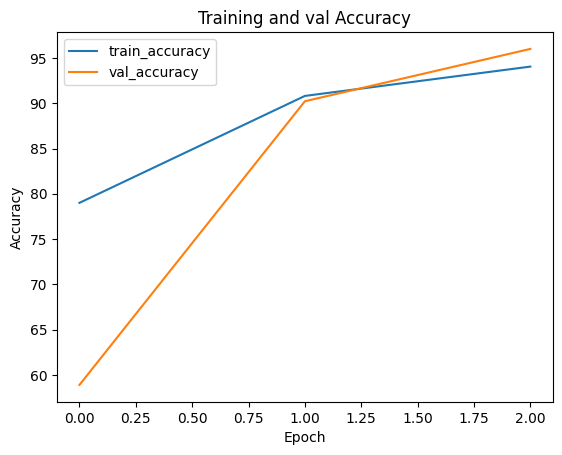

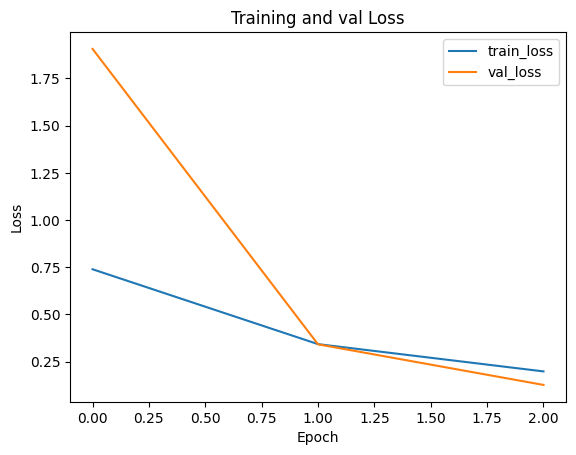

In [73]:
plt.figure()
plt.plot(train_accuracy_list, label="train_accuracy")
plt.plot(val_accuracy_list, label="val_accuracy")
plt.legend()

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.title('Training and val Accuracy')

plt.figure()
plt.plot(train_loss_list, label="train_loss")
plt.plot(val_loss_list, label="val_loss")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and val Loss')

# Evaluating the Model

**Loading the best saved model:**

In [74]:
best_val_model_path = '/content/best_val_checkpoint.pth'
best_val_checkpoint = torch.load(best_val_model_path, map_location=torch.device(device))

In [75]:
# Before loading the state_dict of the model, make sure the "model" instance is
# initiated by its corresponding class e.g. VGG16
model.load_state_dict(best_val_checkpoint['model'])

<All keys matched successfully>

In [76]:
with torch.no_grad():
    test_loss, test_accuracy  = run_1_epoch(model, loss_function, test_loader, train= False)

print('test loss: %.4f'%(test_loss))
print('test_accuracy %.2f' % (test_accuracy))


 12%|█▎        | 1/8 [00:00<00:02,  3.11it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 25%|██▌       | 2/8 [00:00<00:02,  2.66it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 38%|███▊      | 3/8 [00:01<00:01,  2.66it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 50%|█████     | 4/8 [00:01<00:01,  2.68it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 62%|██████▎   | 5/8 [00:01<00:01,  2.68it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


 75%|███████▌  | 6/8 [00:02<00:00,  2.71it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])


100%|██████████| 8/8 [00:02<00:00,  3.08it/s]

before  torch.Size([64, 15])
after  torch.Size([64, 15])
before  torch.Size([2, 15])
after  torch.Size([2, 15])
test loss: 0.1372
test_accuracy 96.67


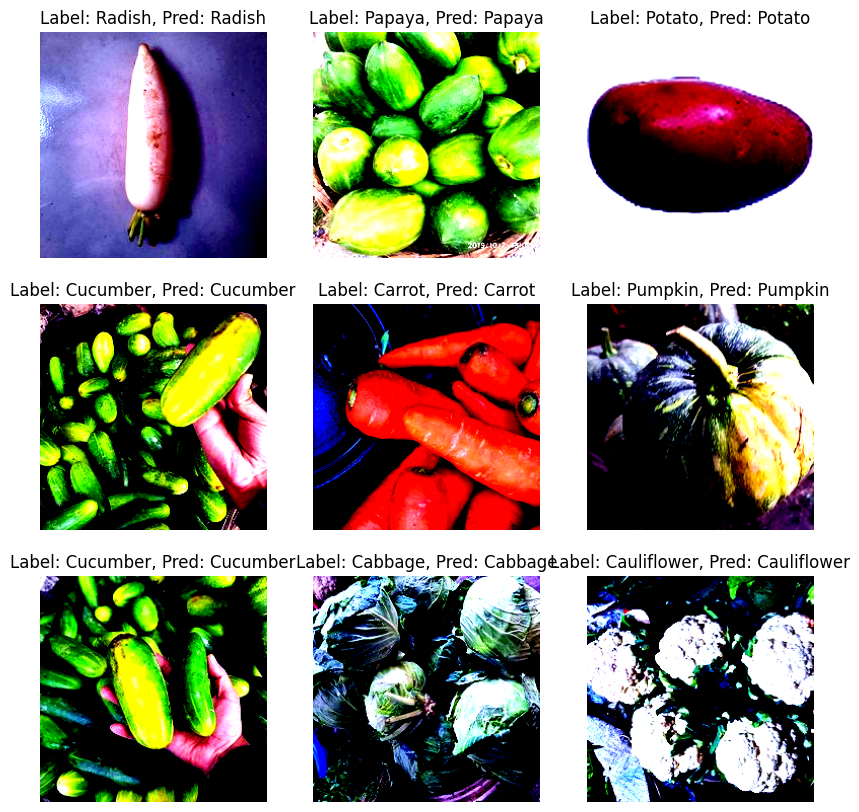

In [77]:
# Get a batch of images from the train_loader
images, labels = next(iter(test_loader))

with torch.no_grad():
  predicted_labels = model(images.to(device))
  predicted_labels = torch.argmax(predicted_labels, 1)
rows = col = 3
#fig, axes = plt.subplots(nrows=5, ncols=5))
plt.figure(figsize = (10,10))

for i in range(rows*col):
  # Plot a random image from the batch
  random_index = np.random.randint(0, images.shape[0])
  image = images[random_index]
  label = labels[random_index]
  pred_label = predicted_labels[random_index]
  plt.subplot(rows, col, i+1)
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))
  plt.title(f'Label: {classes[label]}, Pred: {classes[pred_label]}')

### Useful repositories for gradcam and visualizations.
https://github.com/jacobgil/pytorch-grad-cam

https://github.com/utkuozbulak/pytorch-cnn-visualizations


# Notebook Source
https://github.com/Vision-At-SEECS/Pytorch_Labs/blob/main/Lab3_Transfer_Learning_and_GradCAM.ipynb

You may explore other notebooks in the link of the repository given above.



# ***Scratch Training vs Vgg-pretrained Vs Resnet50-pretrained***



*   ***Incase of scratch training the performace of the model was very poor the maxmimum accuracu reported was `around 50%` and that too was while training. The main reason was the scracity of the dataset with only 3000 images available. So the model was bound to perform this way.***
* ***Incase of using VGG model as feature extracter and then applying the customized classifier worked the best. This was because we used the previous and knowledge and appplid it on our problem. Since the dataset was very small, this approach was ideal. `98%` accuracy on test set is evidence of this conjecture.***
* ***In last we used the resnet-50 model as feature extractor and as expected it also worked great giving the `96.7%`accuracy on testset. The reason once again was the transfer learning approach.***

